Tomographic Reconstruction (experimental data)
===
Here, we calculate reconstructed images from captured data by the fast camera with the L-curve
criterion.

In [1]:
from pathlib import Path

import numpy as np
from matplotlib import pyplot as plt
from matplotlib.axes import Axes
from matplotlib.ticker import MultipleLocator
from mpl_toolkits.axes_grid1 import ImageGrid
from numpy.lib.format import open_memmap
from numpy.typing import NDArray
from raysect.optical import Point3D, Spectrum, Vector3D, World

from cherab.phix.inversion import Lcurve
from cherab.phix.tools.raytransfer import import_phix_rtc
from cherab.phix.tools.utils import profile_1D_to_2D, profile_2D_to_1D
from cherab.phix.tools.visualize import show_phix_profile

plt.rcParams["figure.dpi"] = 150

# Path diffinition
EXP_DATA = Path().cwd().parent.parent.parent / "output" / "experiment_data" / "shot_17393"
SVD_DIR = (
    Path().cwd().parent.parent.parent / "output" / "RTM" / "2022_12_13_00_49_29" / "w_laplacian"
)

# Create scene objects
world = World()
rtc = import_phix_rtc(world)

Example experimental Data
---
Show the waveform of shot #17393 and camera images

In [2]:
# Load Data
_Ip_time = np.loadtxt(EXP_DATA / "Ip_fill.csv", delimiter=",")
time = _Ip_time[:, 0]
plasma_current = _Ip_time[:, 1] * 1.0e-3
loop_vltage = np.loadtxt(EXP_DATA / "VL_fill.csv", delimiter=",")[:, 1]

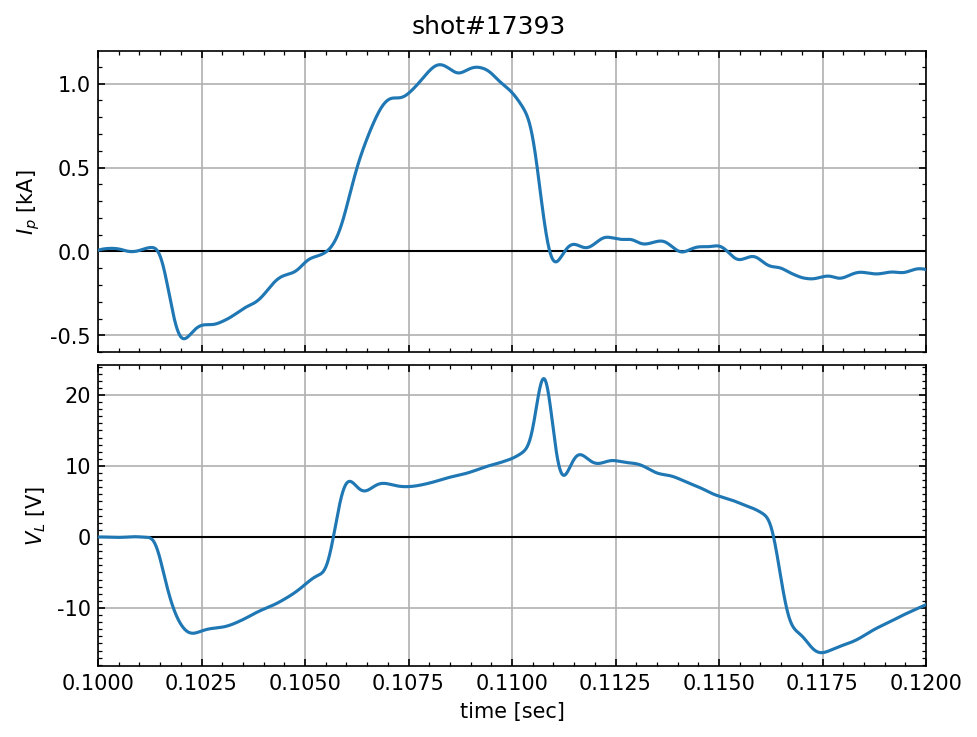

In [3]:
fig, axes = plt.subplots(2, 1, constrained_layout=True)
i = 0
for ax, data, label in zip(axes, [plasma_current, loop_vltage], ["$I_p$ [kA]", "$V_L$ [V]"]):
    ax.plot(time, data, zorder=3)
    ax.set_ylabel(label)
    ax.set_xlim(0.1, 0.12)

    ax.xaxis.set_minor_locator(MultipleLocator(0.0005))
    ax.xaxis.set_major_locator(MultipleLocator(0.0025))
    ax.xaxis.set_major_formatter("{x:.4f}")
    ax.tick_params(direction="in", labelsize=10, which="both", top=True, right=True)

    ax.grid(zorder=0)

    ax.plot([time[0], time[-1]], [0, 0], color="k", linewidth=1, zorder=2)

    if i < 1:
        ax.set_xticklabels([])
    i += 1

axes[0].yaxis.set_minor_locator(MultipleLocator(0.1))
axes[1].yaxis.set_minor_locator(MultipleLocator(1.0))
axes[0].yaxis.set_major_formatter("{x:.1f}")
axes[1].yaxis.set_major_formatter("{x:.0f}")
axes[-1].set_xlabel("time [sec]")
fig.suptitle("shot#17393");

Tomographic Reconstruction with L-curve criterion
---
Let us reconstruct the one frame (1069 frame) of Video image.


In [4]:
camera_frame = open_memmap(EXP_DATA / "Halpha" / "1069.npy")

Load SVD components using `numpy.memmap` array.

In [5]:
s = open_memmap(SVD_DIR / "s.npy")
u = open_memmap(SVD_DIR / "u.npy")
vh = open_memmap(SVD_DIR / "vh.npy")
inversion_base_vectors = open_memmap(SVD_DIR / "L_inv_V.npy")

Instantiate `Lcurve` class

In [6]:
lcurve = Lcurve(s, u, vh, camera_frame, inversion_base_vectors=inversion_base_vectors)
lcurve.lambdas = 10 ** np.linspace(-21, -15)

Execute L-curve optimization

In [7]:
lcurve.optimize(itemax=5)

completed the optimization (iteration times : 5)


Plot L-curve and its curvature. The red cross point corresponds to the optimal regularization parameter.

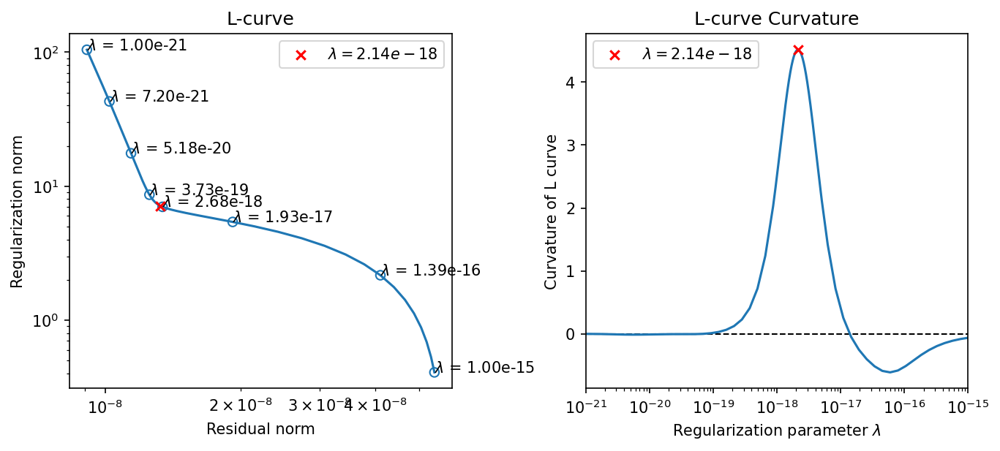

In [8]:
fig, axes = plt.subplots(1, 2, constrained_layout=True, figsize=(9, 4))

# L-curve plot
lcurve.plot_L_curve(fig=fig, axes=axes[0], scatter_plot=8)
axes[0].set_title("L-curve")
axes[0].legend()

# curvature plot
lcurve.plot_curvature(fig=fig, axes=axes[1])
axes[1].set_title("L-curve Curvature")
axes[1].legend();

Show the reconstructed image and camera image. (Note that the camera image is flipped left to right.)

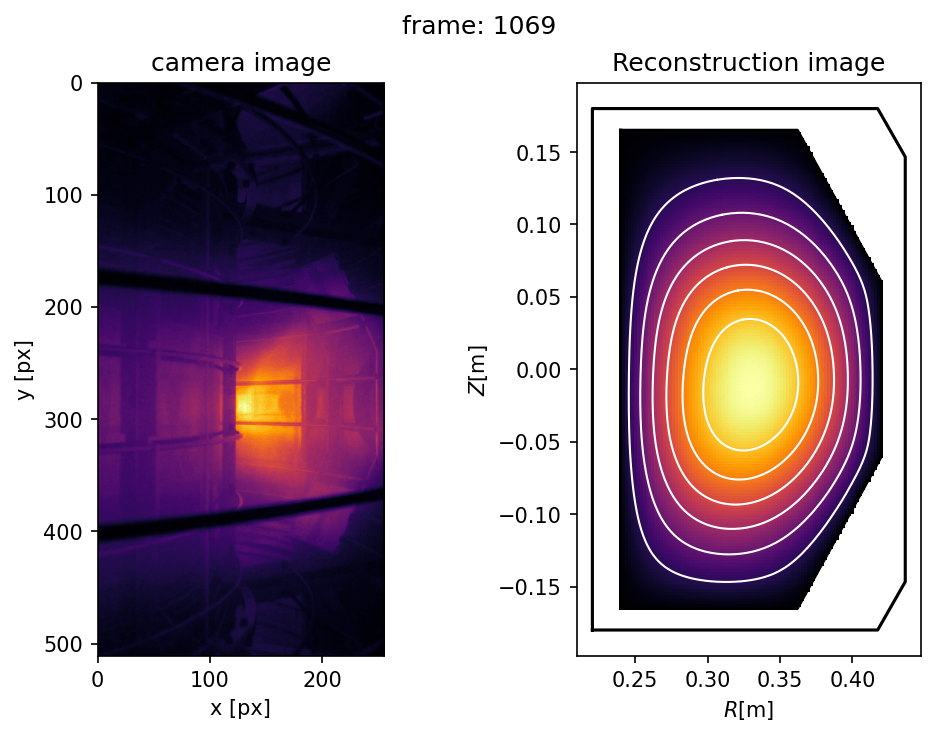

In [9]:
fig, axes = plt.subplots(1, 2, constrained_layout=True)
axes[0].imshow(np.fliplr(camera_frame.T), cmap="inferno", extent=(0, 255, 511, 0))
# axes[0].plot(limiter[:, 0] - 1, limiter[:, 1] - 1, color="w", linewidth=0.5)
axes[0].set_title("camera image")
axes[0].set_xlabel("x [px]")
axes[0].set_ylabel("y [px]")
contours = show_phix_profile(
    axes[1], profile_1D_to_2D(lcurve.optimized_solution(), rtc=rtc), rtc=rtc, vmin=0
)
axes[1].set_title("Reconstruction image")
axes[1].set_xlabel("$R$[m]")
axes[1].set_ylabel("$Z$[m]")
fig.suptitle(f"frame: {1069}");

Project the reconstructed-image contours onto camera image
---
Using the `calcam` functionality enables us to show the reconstructed-image contours on the camera
image.

In [10]:
from calcam import CADModel, Calibration

from cherab.phix import __path__

CALIB_PATH = (
    Path(__path__[0]) / "observer" / "fast_camera" / "calibration_data" / "shot_17393_ideal.ccc"
)
CAD_PATH = Path(__path__[0]) / "machine" / "geometry" / "data" / "PHiX_calcam_CAD.ccm"

# Load the calibration
cam_calib = Calibration(CALIB_PATH)

# Load the CAD model
phix_cad = CADModel(CAD_PATH)

Extracting CAD model...


To show the camera image flipped left to right, we have to transform the the contours points as well.
The following local functions are defined to manage it and show contours to the specific axes.

In [11]:
from scipy.interpolate import interp1d


def fliplr(points_2D: np.ndarray) -> np.ndarray:
    """To flip the 2D points from left to right in image"""
    new_points = np.zeros_like(points_2D)
    center = np.array([125, 256])
    for i in range(len(points_2D[:, 0])):
        new_points[i, :] = (
            2 * np.array([center[0], 0]) + np.array([[-1, 0], [0, 1]]) @ points_2D[i, :]
        )
    return new_points


def project_lines(lines: list[NDArray], phi: float) -> list[NDArray]:
    """Project lines onto a image at a certain toroidal angle."""
    projected_lines = []
    for line in lines:
        line_xyz = np.vstack([line[:, 0] * np.cos(phi), line[:, 0] * np.sin(phi), line[:, 1]]).T

        projected_lines += [cam_calib.project_points(line_xyz, check_occlusion_with=phix_cad)[0]]

    return projected_lines


def project_limiter_points(phi: float) -> NDArray:
    """Project interpolated limiter edge points onto a image at a certain toroidal angle."""

    # resample inner limiter nodes
    INNER_LIMITER = np.array(
        [
            [0.2400, 0.1650],
            [0.2400, -0.1650],
            [0.3550, -0.165],
            [0.42, -0.06],
            [0.42, 0.06],
            [0.3550, 0.165],
            [0.2400, 0.1650],
        ]
    )
    r_interpolated = interp1d(np.linspace(0, 1, len(INNER_LIMITER[:, 0])), INNER_LIMITER[:, 0])
    z_interpolated = interp1d(np.linspace(0, 1, len(INNER_LIMITER[:, 1])), INNER_LIMITER[:, 1])

    # re-sampling Limiter edge
    limiter = np.array([[r_interpolated(i), z_interpolated(i)] for i in np.linspace(0, 1, 500)])

    limiter_xyz = np.vstack(
        [limiter[:, 0] * np.cos(phi), limiter[:, 0] * np.sin(phi), limiter[:, 1]]
    ).T
    limiter_projected = cam_calib.project_points(limiter_xyz, check_occlusion_with=phix_cad)[0]

    return limiter_projected

Show the projected image contours

Loading mesh file: FBC_half_down.STL...
Loading mesh file: FBC_half_down2.STL...
Loading mesh file: FBC_half_up.STL...
Loading mesh file: FBC_half_up2.STL...
Loading mesh file: FL_half.STL...
Loading mesh file: FL_half2.STL...
Loading mesh file: limiter_225.STL...
Loading mesh file: limiter_box.STL...
Loading mesh file: MG_port.STL...
Loading mesh file: vaccum_flange.STL...
Loading mesh file: rail_connection_half.STL...
Loading mesh file: rail_connection_half2.STL...
Loading mesh file: rail_half_down.STL...
Loading mesh file: rail_half_down2.STL...
Loading mesh file: rail_half_up.STL...
Loading mesh file: rail_half_up2.STL...
Loading mesh file: vessel_gasket_half.STL...
Loading mesh file: vessel_gasket_half2.STL...
Loading mesh file: vessel_wall_fine.STL...
Loading mesh file: vessel_wall_fine2.STL...


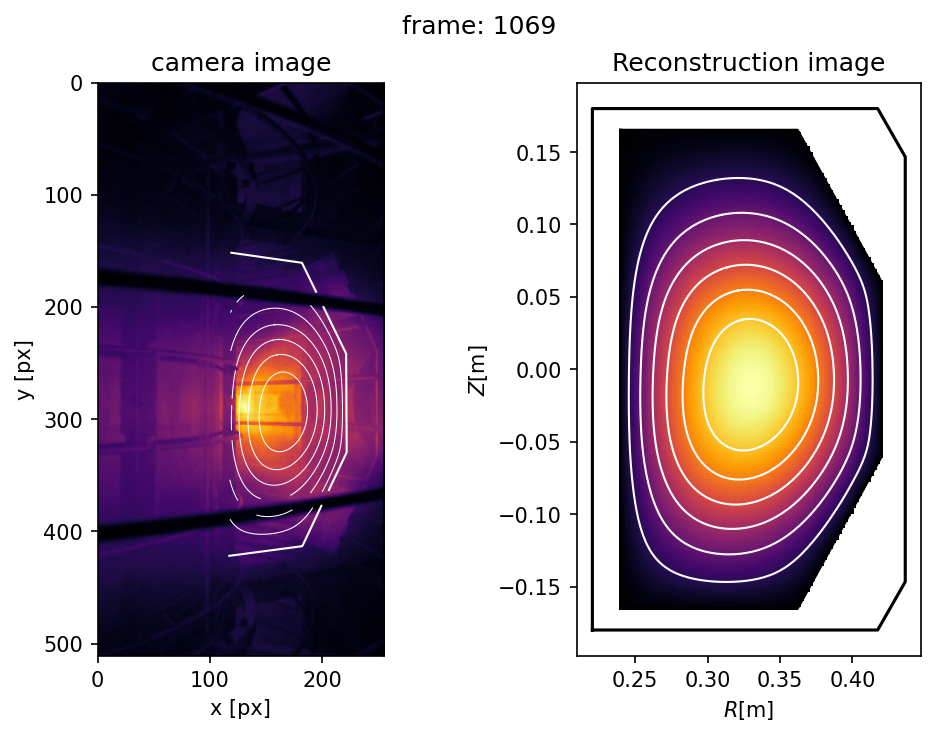

In [12]:
# toroidal angle where the contours are projected.
phi = (180 + 45) * np.pi / 180

fig, axes = plt.subplots(1, 2, constrained_layout=True)

# Show recontructed image
contours = show_phix_profile(
    axes[1], profile_1D_to_2D(lcurve.optimized_solution(), rtc=rtc), rtc=rtc, vmin=0
)
axes[1].set_title("Reconstruction image")
axes[1].set_xlabel("$R$[m]")
axes[1].set_ylabel("$Z$[m]")

# Show camera image with projected contours
axes[0].imshow(np.fliplr(camera_frame.T), cmap="inferno", extent=(0, 255, 511, 0))
contours = project_lines(contours, phi)
for cont in contours:
    cont = fliplr(cont)
    axes[0].plot(cont[:, 0], cont[:, 1], color="w", linewidth=0.5)

# plot projected limiter
limiter_pts = fliplr(project_limiter_points(phi))
axes[0].plot(limiter_pts[:, 0], limiter_pts[:, 1], color="w", linewidth=1.0)


axes[0].set_title("camera image")
axes[0].set_xlabel("x [px]")
axes[0].set_ylabel("y [px]")
axes[0].set_xlim(0, 255)
fig.suptitle(f"frame: {1069}");

Some frames of reconstruction
---
Then, let us do the tomography with some camera video frames and display them.

In advance, extract both maximum values of camera images and reconstructed solutions.

In [13]:
plt.rcParams["font.size"] = 8

# selected frames
FRAMES = [1050, 1060, 1070, 1080, 1090]

# maximum value of camera images and reconstructed ones
vmax_camera = 0.0
vmax_reconst = 0.0

lcurve.quiet = True
for frame in FRAMES:
    camera_image = open_memmap(EXP_DATA / "Halpha" / f"{frame}.npy")
    vmax_camera = vmax if (vmax := np.amax(camera_image)) > vmax_camera else vmax_camera

    lcurve.data = camera_image
    vmax_reconst = vmax if (vmax := lcurve.optimized_solution(itemax=5).max()) else vmax_reconst

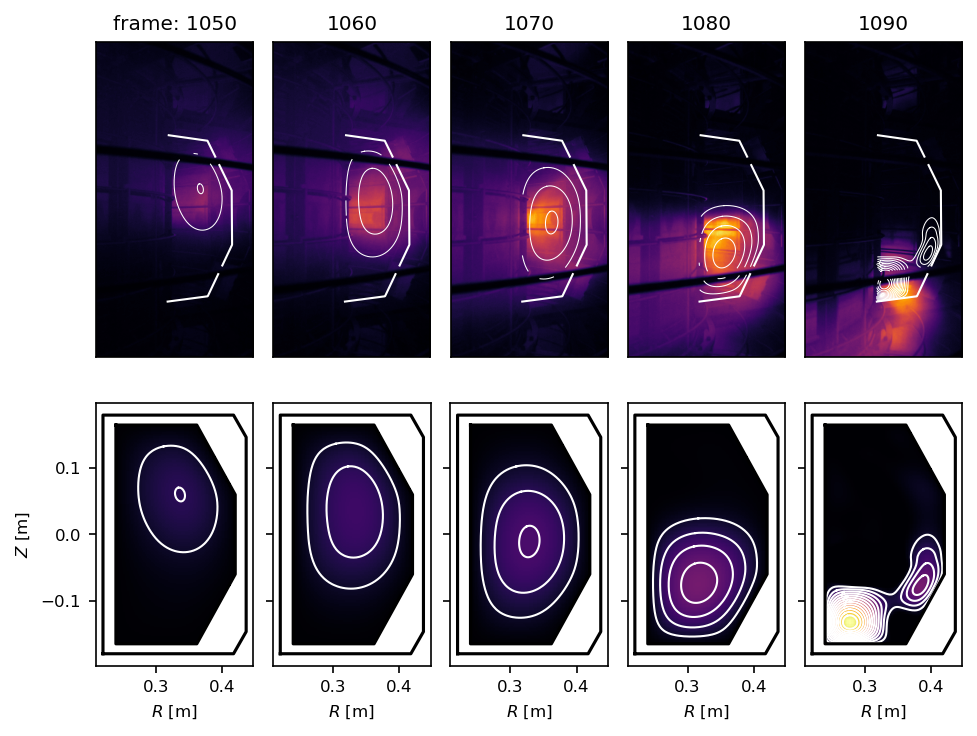

In [14]:
fig, axes = plt.subplots(2, 5, constrained_layout=True)
axes[1, 0].set_ylabel("$Z$ [m]")

for i, frame in enumerate(FRAMES):
    # Load camera image
    camera_image = open_memmap(EXP_DATA / "Halpha" / f"{frame}.npy")

    # tomographic reconstruction
    lcurve.data = camera_image
    lcurve.quiet = True
    reconst_image = profile_1D_to_2D(lcurve.optimized_solution(itemax=5), rtc=rtc)

    # show camera image
    axes[0, i].imshow(
        np.fliplr(camera_image.T), vmax=vmax_camera, cmap="inferno", extent=(1, 256, 512, 1)
    )

    axes[0, i].xaxis.set_visible(False)
    axes[0, i].yaxis.set_visible(False)

    # show reconstructed image
    contours = show_phix_profile(
        axes[1, i],
        reconst_image,
        rtc=rtc,
        vmin=0,
        vmax=vmax_reconst,
        levels=np.linspace(0, vmax_reconst, 15),
    )
    axes[1, i].set_xlabel("$R$ [m]")
    if i > 0:
        axes[1, i].yaxis.set_ticklabels([])
        axes[0, i].set_title(f"{frame}")
    else:
        axes[0, i].set_title(f"frame: {frame}")

    # project contours onto camera images
    contours = project_lines(contours, phi)
    for cont in contours:
        cont = fliplr(cont)
        axes[0, i].plot(cont[:, 0], cont[:, 1], color="w", linewidth=0.5)

    # plot projected limiter
    limiter_pts = fliplr(project_limiter_points(phi))
    axes[0, i].plot(limiter_pts[:, 0], limiter_pts[:, 1], color="w", linewidth=1.0)

Create tomography GIF animation from all camera frames
---

Let us reconstruct from all camera frames and create GIF animation of camera images with reconstructed
contours projected on.

In advance, extract both maximum values of camera images and reconstructed solutions.

In [15]:
FRAME_FILES = sorted([path for path in (EXP_DATA / "Halpha").glob("*.npy")])

# maximum value of camera images and reconstructed ones
vmax_camera = 0.0
vmax_reconst = 0.0

lcurve.quiet = True

stored_reconst = []

for i, frame_file in enumerate(FRAME_FILES):
    camera_image = open_memmap(frame_file)

    # update the maximum value of camera image
    vmax_camera = vmax if (vmax := np.amax(camera_image)) > vmax_camera else vmax_camera

    # tomographic reconstruction
    lcurve.data = camera_image
    stored_reconst += [lcurve.optimized_solution(itemax=5)]

    # update the maximum value of reconstructe image
    vmax_reconst = vmax if (vmax := np.amax(stored_reconst[i])) > vmax_reconst else vmax_reconst

Create animation

In [16]:
from IPython import display
from matplotlib.animation import FuncAnimation

from cherab.phix.tools.utils import calc_contours

# Initialize figure and axes object and set its properties
fig, ax = plt.subplots(constrained_layout=True, figsize=(2.5, 5.0))
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)

# create lines initially without data
lines = [ax.plot([], [], color="w", linewidth=0.5)[0] for _ in range(100)]

# select initial frame
frame_file = FRAME_FILES[0]

# Load and show camera image
camera_image = open_memmap(frame_file)
image = ax.imshow(
    np.fliplr(camera_image.T), vmax=vmax_camera, cmap="inferno", extent=(1, 256, 512, 1)
)

# convert 2D from 1D solution
reconst_image = profile_1D_to_2D(stored_reconst[0], rtc=rtc)

# calculate contours of reconstructed image
levels = np.linspace(0.0, vmax_reconst, 15)
contours = []
for level in levels[1:]:
    contours += calc_contours(reconst_image, level, rtc=rtc)

# project contours onto camera images
contours = project_lines(contours, phi)

# plot contours
j = 0
for cont, line in zip(contours, lines):
    cont = fliplr(cont)
    line.set_data(cont.T)
    j += 1

# remove the reset of line data
for line in lines[j:]:
    line.set_data([], [])

# plot projected limiter
limiter_pts = fliplr(project_limiter_points(phi))
ax.plot(limiter_pts[:, 0], limiter_pts[:, 1], color="w", linewidth=1.0)

# set title
ax.set_title(f"frame: {frame_file.stem}")


def update(i, lines):
    # select one frame
    frame_file = FRAME_FILES[i]

    # Load and update camera image data
    camera_image = open_memmap(frame_file)
    image.set_data(np.fliplr(camera_image.T))

    # convert 2D from 1D solution
    reconst_image = profile_1D_to_2D(stored_reconst[i], rtc=rtc)

    # calculate contours of reconstructed image
    contours = []
    for level in levels[1:]:
        contours += calc_contours(reconst_image, level, rtc=rtc)

    # project contours onto camera images
    contours = project_lines(contours, phi)

    # update contours
    j = 0
    for cont, line in zip(contours, lines):
        cont = fliplr(cont)
        line.set_data(cont.T)
        j += 1

    # remove the rest of line data
    for line in lines[j:]:
        line.set_data([], [])

    # update title
    ax.set_title(f"frame: {frame_file.stem}")

    return lines


animation = FuncAnimation(
    fig,
    update,
    fargs=(lines,),
    interval=300,
    blit=False,
    frames=len(FRAME_FILES),
    repeat_delay=300,
)

html = display.HTML(animation.to_jshtml())
display.display(html)
plt.close()

Generate a GIF file

In [17]:
# To save the animation using Pillow as a gif
animation.save(str(EXP_DATA / "frames.gif"), fps=4, bitrate=699000, writer="pillow")